## Final Project Submission

Please fill out:
* Student name: Phillip Ojo
* Student pace: Part time 
* Scheduled project review date/time: August 18th 4:30pm
* Instructor name: James Irving
* Blog post URL: https://phillipojo24.github.io/linear_regression_model



## Introduction

### Problem Statement

We have been tasked with investigating the sale price of houses in the King County area and build a multivariable linear regression model to predict sale prices.

Throughout this exploration we will answer the following questions.

* Does the number of bedrooms have a high impact on sale price?

Understanding what number of bedrooms affect the price. 

* Does the diffrence in Zipcode affect sale price?

If you live in a certain zipcode how much is your sale price affected.

* Which features have a high impact on sales price?

If you are a homeowner and you want to increase your sale price, what features should you focus on.


## Data

A dataset has been provided and can be found in the kc_house_data.csv file in this repository.


The column names and descriptions as provided can be found in the column_names.md file in this repository. For convenience they have been reproduced below.

###Column Names and descriptions for Kings County Data Set

* id - unique identified for a house
* dateDate - house was sold
* pricePrice - is prediction target
* bedroomsNumber - of Bedrooms/House
* bathroomsNumber - of bathrooms/bedrooms
* sqft_livingsquare - footage of the home
* sqft_lotsquare - footage of the lot
* floorsTotal - floors (levels) in house
* waterfront - House which has a view to a waterfront
* view - Has been viewed
* condition - How good the condition is ( Overall )
* grade - overall grade given to the housing unit, based on King County grading system
* sqft_above - square footage of house apart from basement
* sqft_basement - square footage of the basement
* yr_built - Built Year
* yr_renovated - Year when house was renovated
* zipcode - zip
* lat - Latitude coordinate
* long - Longitude coordinate
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

# Obtain Data

In [1]:
# Your code here - remember to use markdown cells for comments as well!

import pandas as pd

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')

from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.model_selection import train_test_split

df = pd.read_csv('kc_house_data.csv')
df.drop(columns = 'id', inplace = True)
df

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,3,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [2]:
#GETTING DATA INFO
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   bedrooms       21597 non-null  int64  
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     19221 non-null  float64
 8   view           21534 non-null  float64
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  object 
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   17755 non-null  float64
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [3]:
#GETTING DATA BASIC STATS
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [4]:
#LOOKING AT NULL VALUES
df.isna().sum()

date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

# SCRUB (DATA CLEANING)

In [5]:
#WANT TO FILL ALL NULL VALUES IN WATERFRONT WITH DISTRIBUTION OF 146:19075
s = df.waterfront.value_counts(normalize = True)
print(s)

0.0    0.992404
1.0    0.007596
Name: waterfront, dtype: float64


In [6]:
waterfront_null = df.waterfront.isnull()
df.loc[waterfront_null,'waterfront'] = np.random.choice(s.index,size=len(df[waterfront_null]),p=s.values)
print(df.waterfront.value_counts())

0.0    21433
1.0      164
Name: waterfront, dtype: int64


In [7]:
#CONVERTING DATE FROM OBJECT TO DATE
df['date'] = pd.to_datetime(df['date'])
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21597, dtype: datetime64[ns]

In [8]:
#REPLACE ? WITH 0 IN SQFT_BASEMENT
df.sqft_basement.replace('?',0,inplace = True)

In [9]:
#REPLACING ALL NULL VALUES IN YR_RENOVATED TO 0 BECAUSE MAJORITY IS 0
for index, col in enumerate(df.yr_renovated.isnull()):
    if col == True:
        df.yr_renovated[index] = 0
df


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,1.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0.0,0.0,3,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [10]:
#TURNING VALUES FROM FLOAT TO INT
float_list = ['sqft_basement','waterfront','yr_renovated']
for col in float_list:
    df[col] = pd.to_numeric(df[col]).astype(int).round(0)

In [11]:
#ZIPCODE TO SUB_REGION DF
subregion_df = pd.read_excel('SubRegZipCityNeighborhood.xlsx')
subregion_df.columns= ['zipcode', 'Sub_Region']
subregion_df

,zipcode,Sub_Region
0,98001,South Urban
1,98002,South Urban
2,98003,South Urban
3,98004,East Urban
4,98005,East Urban
...,...,...
115,98199,Seattle
116,98224,East Rural
117,98251,East Rural
118,98288,East Rural


In [12]:
df = df.join(subregion_df.set_index('zipcode'),on = 'zipcode')
df

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,Sub_Region
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,1,0.0,3,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,South Urban
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0.0,3,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,Seattle
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0.0,3,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,North
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0.0,5,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,Seattle
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0.0,3,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,East Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0.0,3,...,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,Seattle
21593,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0.0,3,...,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,South and Seattle
21594,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0.0,3,...,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,Seattle
21595,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0.0,3,...,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,East Urban


In [13]:
df['Sub_Region'].value_counts()

Seattle              6233
East Urban           5694
South Urban          5278
North                1197
South Rural           922
East Rural            922
North & Seattle       748
South and Seattle     288
Vashon Island         117
Name: Sub_Region, dtype: int64

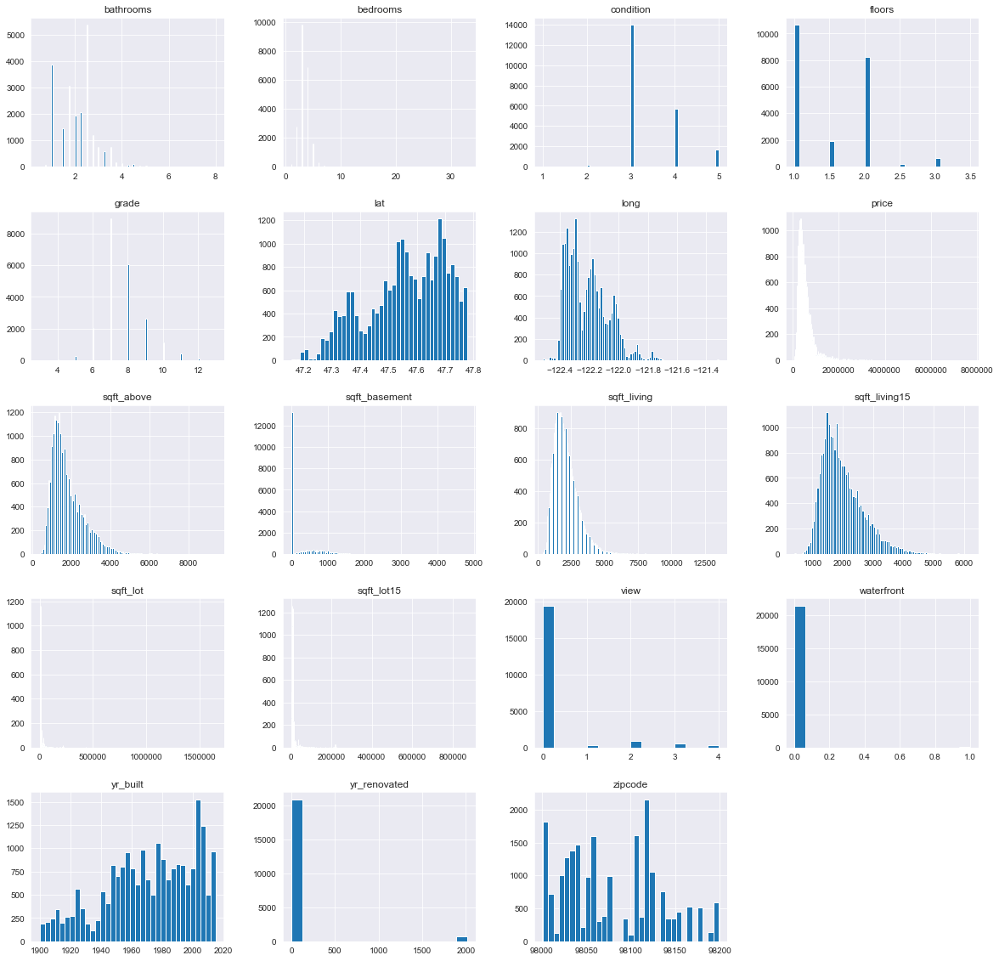

In [14]:
#Plot histograms of our x variables
df.hist(figsize=(20,20), bins = 'auto');

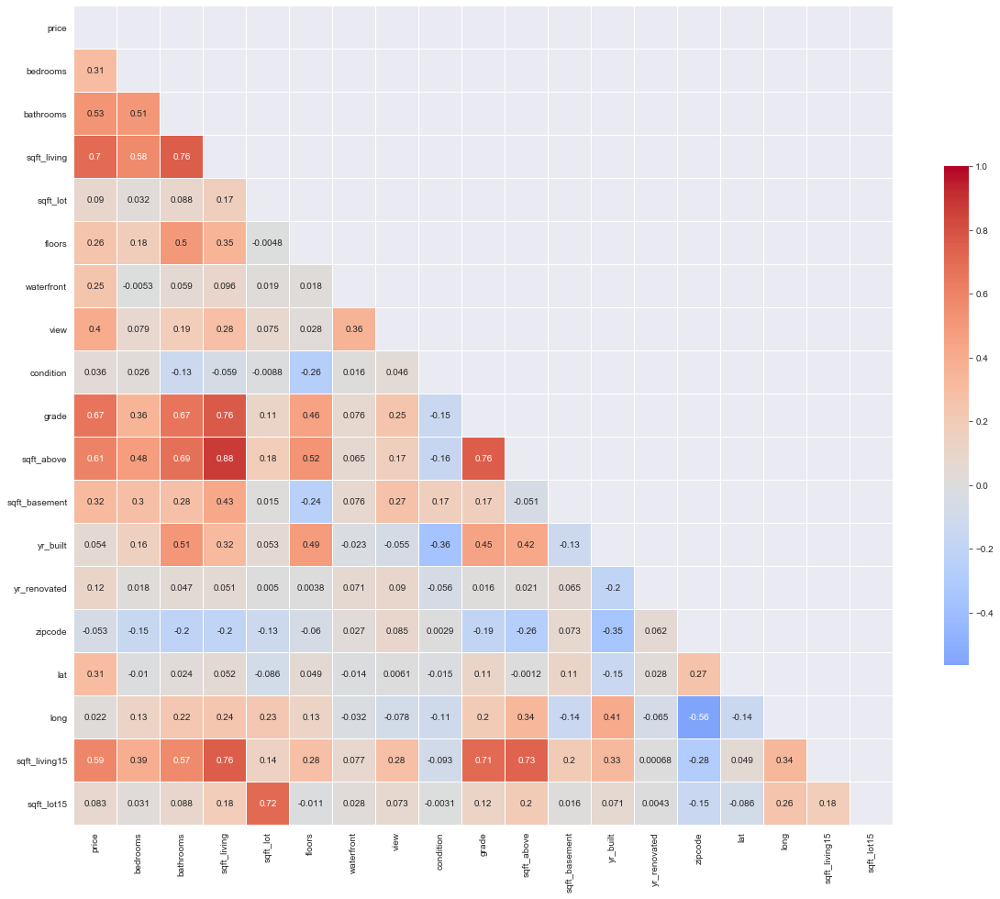

In [15]:
#CORRELATION HEATMAP
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=1, center=0,
            square=True, linewidths=.5,annot=True, cbar_kws={"shrink": .5});

In [16]:
#TURNING COLUMNS TO STRING FOR HOT ENCODING
categories = ['Sub_Region','waterfront']
for cat in categories:
    df[cat] = df[cat].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           21597 non-null  datetime64[ns]
 1   price          21597 non-null  float64       
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  object        
 8   view           21534 non-null  float64       
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [17]:
#One-HOT ENCODING
dummies = pd.get_dummies(df[categories],prefix = categories,drop_first = True)
df_preprocessed = df.drop(categories,axis = 1)
df_preprocessed = pd.concat([df_preprocessed,dummies],axis = 1)
df_preprocessed

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,...,Sub_Region_East Urban,Sub_Region_North,Sub_Region_North & Seattle,Sub_Region_Seattle,Sub_Region_South Rural,Sub_Region_South Urban,Sub_Region_South and Seattle,Sub_Region_Vashon Island,Sub_Region_nan,waterfront_1
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,...,0,0,0,0,0,1,0,0,0,1
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,...,0,0,0,1,0,0,0,0,0,0
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,3,6,...,0,1,0,0,0,0,0,0,0,0
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,...,0,0,0,1,0,0,0,0,0,0
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,3,8,...,0,0,0,1,0,0,0,0,0,0
21593,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,3,8,...,0,0,0,0,0,0,1,0,0,0
21594,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,3,7,...,0,0,0,1,0,0,0,0,0,0
21595,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0.0,3,8,...,1,0,0,0,0,0,0,0,0,0


In [18]:
#CREATING OUTLIER LIST TO REMOVE ONLY REMOVE OUTLIERS FROM DESIRED COLUMNS
outliers_list = ['bedrooms','sqft_basement','sqft_above','sqft_living','sqft_lot','sqft_lot15','price']

#GETTING Z SCORES FOR ALL COLUMNS
z = np.abs(stats.zscore(df_preprocessed[outliers_list]))

#REMOVING OUTLIERS (USED Z<= 1.96 TO MAINTAIN 95% OF THE DATA)
df_preprocessed = df_preprocessed[(z<=3).all(axis=1)]
df_preprocessed

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,...,Sub_Region_East Urban,Sub_Region_North,Sub_Region_North & Seattle,Sub_Region_Seattle,Sub_Region_South Rural,Sub_Region_South Urban,Sub_Region_South and Seattle,Sub_Region_Vashon Island,Sub_Region_nan,waterfront_1
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,...,0,0,0,0,0,1,0,0,0,1
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,...,0,0,0,1,0,0,0,0,0,0
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,3,6,...,0,1,0,0,0,0,0,0,0,0
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,...,0,0,0,1,0,0,0,0,0,0
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,3,8,...,0,0,0,1,0,0,0,0,0,0
21593,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,3,8,...,0,0,0,0,0,0,1,0,0,0
21594,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,3,7,...,0,0,0,1,0,0,0,0,0,0
21595,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0.0,3,8,...,1,0,0,0,0,0,0,0,0,0


# Explore

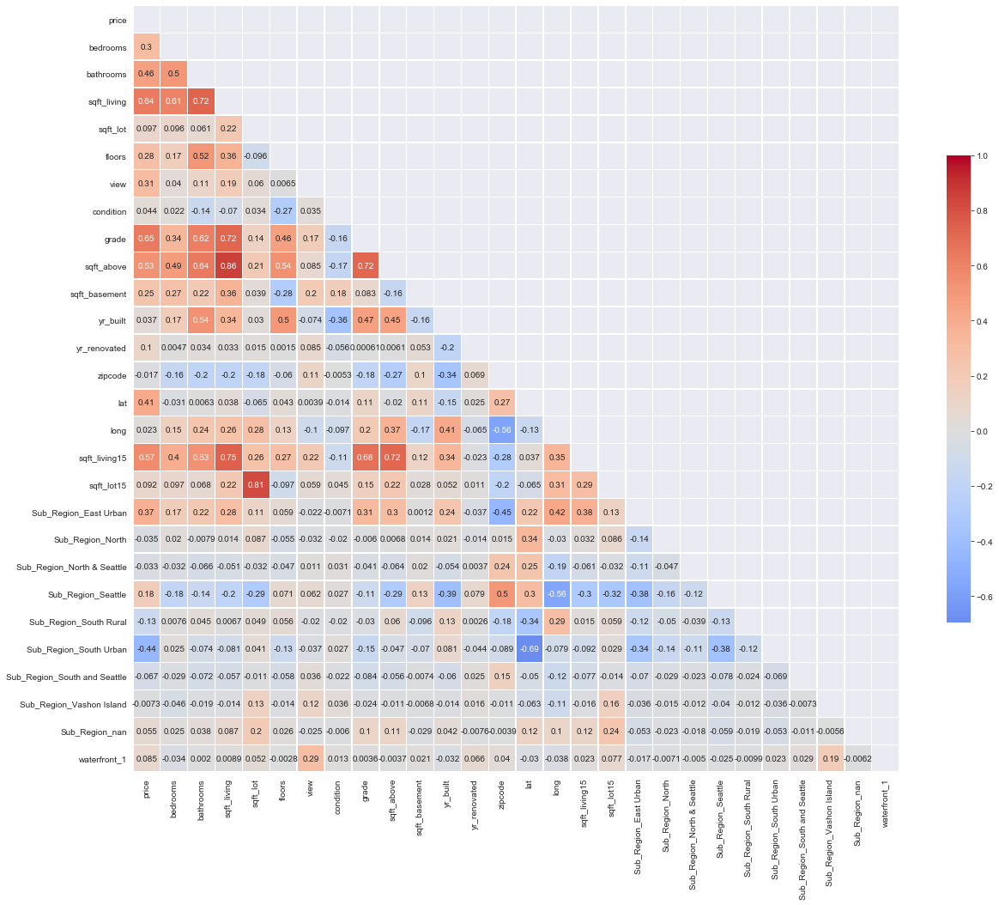

In [19]:
#CORRELATION HEATMAP
corr = df_preprocessed.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=1, center=0,
            square=True, linewidths=.5,annot=True, cbar_kws={"shrink": .5});

# Starting Model

In [20]:
#2) set view nulls to 0, assumption: nulls mean nobody has viewed
df_preprocessed['view'] = df_preprocessed['view'].fillna(0)

In [21]:
#DROPPING COLUMNS WITH HIGH CORRELATION
df_preprocessed.drop('sqft_above',axis = 1,inplace=True)
df_preprocessed.drop('yr_built',axis = 1,inplace=True)
df_preprocessed.drop('sqft_lot15',axis = 1,inplace=True)
df_preprocessed.drop('Sub_Region_nan',axis = 1,inplace=True)
df_preprocessed.drop('Sub_Region_Vashon Island',axis = 1,inplace=True)

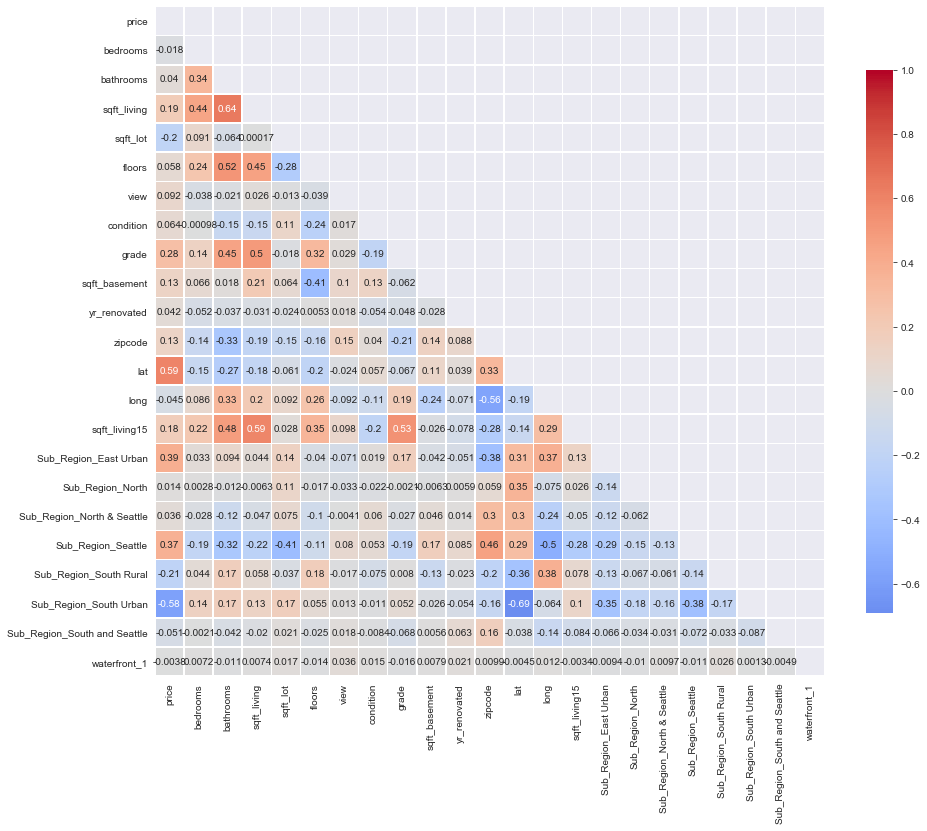

In [23]:
#CORRELATION HEATMAP
corr = df_preprocessed.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(15, 20))

sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=1, center=0,
            square=True, linewidths=.5,annot=True, cbar_kws={"shrink": .5});

In [22]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [23]:
YVar = df_preprocessed['price']
XVar = df_preprocessed.drop(['date', 'price'], axis = 1)


In [24]:
XVar2 = sm.add_constant(XVar)

In [25]:
linearModel = sm.OLS(YVar, XVar2).fit()
linearModel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     2649.
Date:                Wed, 19 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:21:48   Log-Likelihood:            -2.6839e+05
No. Observations:               20383   AIC:                         5.368e+05
Df Residuals:                   20360   BIC:                         5.370e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                        -2.856e+07   2.53e+06    -11.303      0.000   -3.35e+07   -2.36e+07
bedrooms                     -6447.3297   1355.246     -4.757      0.000   -9103.721   -3790.939
bathrooms                       84.0421   2070.207      0.041      0.968   -3973.730    4141.814
sqft_living                    121.9330      2.707     45.048      0.000     116.628     127.238
sqft_lot                         0.4941      0.083      5.933      0.000       0.331       0.657
floors                       -1.544e+04   2410.323     -6.404      0.000   -2.02e+04   -1.07e+04
view                          4.658e+04   1479.358     31.485      0.000    4.37e+04    4.95e+04
condition                     4.377e+04   1451.237     30.159      0.000    4.09e+04    4.66e+04
grade                         6.045e+04   1409.707     42.881      0.000    5.77e+04    6.32e+04
sqft_basement                  -29.8287      3.107     -9.599      0.000     -35.919     -23.738
yr_renovated                    43.6562      2.549     17.126      0.000      38.660      48.653
zipcode                       -160.2499     23.669     -6.770      0.000    -206.644    -113.856
lat                           4.448e+05   1.32e+04     33.654      0.000    4.19e+05    4.71e+05
long                         -1.854e+05   1.22e+04    -15.226      0.000   -2.09e+05   -1.62e+05
sqft_living15                   51.4754      2.443     21.068      0.000      46.686      56.264
Sub_Region_East Urban         8.956e+04   4981.376     17.980      0.000    7.98e+04    9.93e+04
Sub_Region_North             -8.752e+04   6794.971    -12.879      0.000   -1.01e+05   -7.42e+04
Sub_Region_North & Seattle   -5.525e+04   8200.427     -6.738      0.000   -7.13e+04   -3.92e+04
Sub_Region_Seattle            1.166e+05   6632.987     17.572      0.000    1.04e+05     1.3e+05
Sub_Region_South Rural        1.835e+04   7025.660      2.612      0.009    4579.144    3.21e+04
Sub_Region_South Urban       -4.759e+04   6332.465     -7.516      0.000      -6e+04   -3.52e+04
Sub_Region_South and Seattle  5188.8898   1.01e+04      0.512      0.609   -1.47e+04    2.51e+04
waterfront_1                  1.818e+05    1.4e+04     13.026      0.000    1.54e+05    2.09e+05
==============================================================================
Omnibus:                     6217.220   Durbin-Watson:                   1.968
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31191.889
Skew:                           1.392   Prob(JB):                         0.00
Kurtosis:                       8.383   Cond. No.                     2.81e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is corre

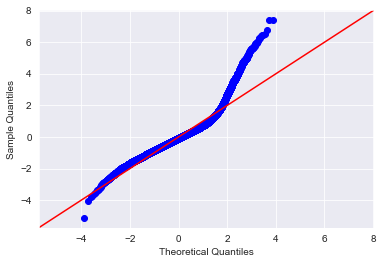

In [26]:
# Your code here - Check that the residuals are normally distributed
fig = sm.graphics.qqplot(linearModel.resid, dist=stats.norm, line='45', fit=True)

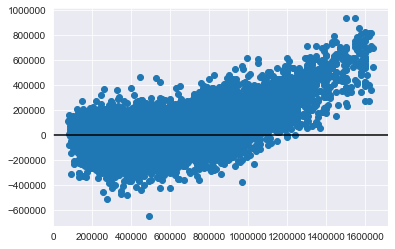

In [27]:
#CHECKING FOR HOMOSCEDACITY
plt.scatter(df_preprocessed['price'],linearModel.resid)
plt.axhline(0,color='black')

### Analysis

This is the base model that we would use to start to try and make improvements. The residuals are normally distributed.


# Question 1

## Does the number of bedrooms have a high affect on price?



In [28]:
# Investigate bedrooms
df_preprocessed['bedrooms'].value_counts()

3    9492
4    6411
2    2699
5    1368
6     223
1     190
Name: bedrooms, dtype: int64

In [29]:
#Create a copy of df to manipulate

bedroom_df = df_preprocessed.copy()


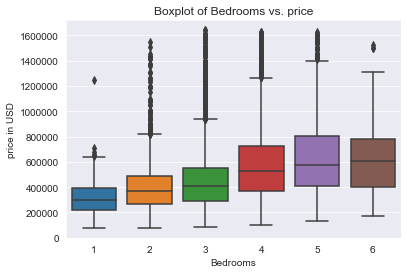

In [30]:
#Plot Boxplot

sns.boxplot(x = bedroom_df['bedrooms'], y = bedroom_df['price'])
plt.title(f"Boxplot of Bedrooms vs. price")
plt.ylabel("price in USD")
plt.xlabel(f"Bedrooms")
plt.show()

In [31]:
#One-HOT Encode Bedroom columns
bed_dummies = pd.get_dummies(bedroom_df['bedrooms'],prefix = 'bedroom_',drop_first = False)
bedroom_df2 = bedroom_df.drop('bedrooms',axis = 1)
bedroom_df2 = pd.concat([bedroom_df2,bed_dummies],axis = 1)
bedroom_df2



,date,price,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_basement,...,Sub_Region_South Rural,Sub_Region_South Urban,Sub_Region_South and Seattle,waterfront_1,bedroom__1,bedroom__2,bedroom__3,bedroom__4,bedroom__5,bedroom__6
0,2014-10-13,221900.00000,1.00000,1180,5650,1.00000,0.00000,3,7,0,...,0,1,0,1,0,0,1,0,0,0
1,2014-12-09,538000.00000,2.25000,2570,7242,2.00000,0.00000,3,7,400,...,0,0,0,0,0,0,1,0,0,0
2,2015-02-25,180000.00000,1.00000,770,10000,1.00000,0.00000,3,6,0,...,0,0,0,0,0,1,0,0,0,0
3,2014-12-09,604000.00000,3.00000,1960,5000,1.00000,0.00000,5,7,910,...,0,0,0,0,0,0,0,1,0,0
4,2015-02-18,510000.00000,2.00000,1680,8080,1.00000,0.00000,3,8,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.00000,2.50000,1530,1131,3.00000,0.00000,3,8,0,...,0,0,0,0,0,0,1,0,0,0
21593,2015-02-23,400000.00000,2.50000,2310,5813,2.00000,0.00000,3,8,0,...,0,0,1,0,0,0,0,1,0,0
21594,2014-06-23,402101.00000,0.75000,1020,1350,2.00000,0.00000,3,7,0,...,0,0,0,0,0,1,0,0,0,0
21595,2015-01-16,400000.00000,2.50000,1600,2388,2.00000,0.00000,3,8,0,...,0,0,0,0,0,0,1,0,0,0


In [32]:
YVar1 = bedroom_df2['price']
XVar1 = bedroom_df2.drop(['date', 'price'], axis = 1)



In [33]:
XVar3 = sm.add_constant(XVar1)

In [34]:
linearModel2 = sm.OLS(YVar1, XVar3).fit()
linearModel2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     2242.
Date:                Wed, 19 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:23:16   Log-Likelihood:            -2.6839e+05
No. Observations:               20383   AIC:                         5.368e+05
Df Residuals:                   20356   BIC:                         5.370e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                        -2.435e+07   2.17e+06    -11.229      0.000   -2.86e+07   -2.01e+07
bathrooms                      294.6276   2077.815      0.142      0.887   -3778.058    4367.313
sqft_living                    121.6433      2.718     44.752      0.000     116.315     126.971
sqft_lot                         0.4953      0.083      5.944      0.000       0.332       0.659
floors                       -1.538e+04   2411.319     -6.379      0.000   -2.01e+04   -1.07e+04
view                          4.658e+04   1480.147     31.469      0.000    4.37e+04    4.95e+04
condition                      4.39e+04   1453.291     30.210      0.000    4.11e+04    4.68e+04
grade                          6.08e+04   1422.529     42.740      0.000     5.8e+04    6.36e+04
sqft_basement                  -30.0199      3.111     -9.651      0.000     -36.117     -23.923
yr_renovated                    43.6669      2.549     17.130      0.000      38.670      48.663
zipcode                       -162.0518     23.699     -6.838      0.000    -208.504    -115.600
lat                           4.452e+05   1.32e+04     33.681      0.000    4.19e+05    4.71e+05
long                         -1.853e+05   1.22e+04    -15.214      0.000   -2.09e+05   -1.61e+05
sqft_living15                   51.1411      2.453     20.847      0.000      46.333      55.950
Sub_Region_East Urban         8.942e+04   4982.549     17.947      0.000    7.97e+04    9.92e+04
Sub_Region_North             -8.746e+04   6794.445    -12.873      0.000   -1.01e+05   -7.41e+04
Sub_Region_North & Seattle    -5.53e+04   8200.204     -6.744      0.000   -7.14e+04   -3.92e+04
Sub_Region_Seattle            1.162e+05   6640.970     17.496      0.000    1.03e+05    1.29e+05
Sub_Region_South Rural        1.862e+04   7026.483      2.650      0.008    4844.597    3.24e+04
Sub_Region_South Urban       -4.734e+04   6332.883     -7.476      0.000   -5.98e+04   -3.49e+04
Sub_Region_South and Seattle  5233.6316   1.01e+04      0.516      0.606   -1.46e+04    2.51e+04
waterfront_1                  1.812e+05    1.4e+04     12.975      0.000    1.54e+05    2.09e+05
bedroom__1                   -4.031e+06   3.61e+05    -11.152      0.000   -4.74e+06   -3.32e+06
bedroom__2                   -4.048e+06   3.61e+05    -11.199      0.000   -4.76e+06   -3.34e+06
bedroom__3                   -4.058e+06   3.61e+05    -11.229      0.000   -4.77e+06   -3.35e+06
bedroom__4                   -4.064e+06   3.61e+05    -11.245      0.000   -4.77e+06   -3.36e+06
bedroom__5                   -4.063e+06   3.61e+05    -11.241      0.000   -4.77e+06   -3.35e+06
bedroom__6                   -4.083e+06   3.61e+05    -11.298      0.000   -4.79e+06   -3.37e+06
============================================================================

In [35]:
linearModel2.params.sort_values()

const                          -24346524.07391
bedroom__6                      -4083154.57341
bedroom__4                      -4063637.05075
bedroom__5                      -4062706.77845
bedroom__3                      -4057581.99704
bedroom__2                      -4048359.24853
bedroom__1                      -4031084.42573
long                             -185282.66713
Sub_Region_North                  -87462.95447
Sub_Region_North & Seattle        -55304.23176
Sub_Region_South Urban            -47343.72960
floors                            -15382.91934
zipcode                             -162.05175
sqft_basement                        -30.01987
sqft_lot                               0.49528
yr_renovated                          43.66695
sqft_living15                         51.14114
sqft_living                          121.64329
bathrooms                            294.62760
Sub_Region_South and Seattle        5233.63159
Sub_Region_South Rural             18617.06912
condition    

# Analysis 1

One-hot encoding the bedroom column did not improve the model and we can clearly see by the results that the number of bedrooms does have a highly negative affect on price. 

# Question 2 

Does the diffrence in Zipcode affect sale price?

In [36]:
# Make a copy to experiment with zipcodes

zipcode_df = df_preprocessed.copy()

In [37]:
YVar2 = df_preprocessed['price']
XVar2 = df_preprocessed.drop(['date', 'price','Sub_Region_South Rural','zipcode'], axis = 1)
XVar4 = sm.add_constant(XVar2)

In [38]:
linearModel3 = sm.OLS(YVar2, XVar4).fit()
linearModel3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.740
Method:                 Least Squares   F-statistic:                     2904.
Date:                Wed, 19 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:24:15   Log-Likelihood:            -2.6841e+05
No. Observations:               20383   AIC:                         5.369e+05
Df Residuals:                   20362   BIC:                         5.370e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                        -4.179e+07   1.57e+06    -26.546      0.000   -4.49e+07   -3.87e+07
bedrooms                     -6183.7386   1356.375     -4.559      0.000   -8842.342   -3525.135
bathrooms                      790.0457   2070.319      0.382      0.703   -3267.947    4848.038
sqft_living                    120.9131      2.706     44.683      0.000     115.609     126.217
sqft_lot                         0.4752      0.083      5.720      0.000       0.312       0.638
floors                       -1.521e+04   2413.022     -6.302      0.000   -1.99e+04   -1.05e+04
view                           4.56e+04   1474.823     30.919      0.000    4.27e+04    4.85e+04
condition                     4.447e+04   1449.569     30.680      0.000    4.16e+04    4.73e+04
grade                         6.076e+04   1410.503     43.077      0.000     5.8e+04    6.35e+04
sqft_basement                  -29.6561      3.111     -9.533      0.000     -35.754     -23.558
yr_renovated                    43.5074      2.552     17.049      0.000      38.505      48.509
lat                           4.088e+05   1.12e+04     36.651      0.000    3.87e+05    4.31e+05
long                         -1.792e+05   1.19e+04    -15.034      0.000   -2.03e+05   -1.56e+05
sqft_living15                   51.7542      2.445     21.163      0.000      46.961      56.548
Sub_Region_East Urban         8.759e+04   4264.815     20.538      0.000    7.92e+04    9.59e+04
Sub_Region_North             -9.056e+04   6542.575    -13.842      0.000   -1.03e+05   -7.77e+04
Sub_Region_North & Seattle   -6.855e+04   7807.369     -8.780      0.000   -8.39e+04   -5.32e+04
Sub_Region_Seattle            1.032e+05   5868.095     17.595      0.000    9.17e+04    1.15e+05
Sub_Region_South Urban       -6.179e+04   4713.371    -13.109      0.000    -7.1e+04   -5.25e+04
Sub_Region_South and Seattle -1.571e+04   9259.133     -1.696      0.090   -3.39e+04    2441.852
waterfront_1                   1.78e+05    1.4e+04     12.752      0.000    1.51e+05    2.05e+05
==============================================================================
Omnibus:                     6305.808   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            32005.745
Skew:                           1.410   Prob(JB):                         0.00
Kurtosis:                       8.453   Cond. No.                     2.79e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.79e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [39]:
linearModel3.params.sort_values()

const                          -41791414.65534
long                             -179181.42303
Sub_Region_North                  -90562.55811
Sub_Region_North & Seattle        -68552.24166
Sub_Region_South Urban            -61785.43123
Sub_Region_South and Seattle      -15706.79420
floors                            -15207.50171
bedrooms                           -6183.73859
sqft_basement                        -29.65613
sqft_lot                               0.47521
yr_renovated                          43.50743
sqft_living15                         51.75425
sqft_living                          120.91312
bathrooms                            790.04570
condition                          44472.22519
view                               45599.59465
grade                              60760.21349
Sub_Region_East Urban              87588.92544
Sub_Region_Seattle                103247.65505
waterfront_1                      177990.66052
lat                               408771.70778
dtype: float6

In [40]:
# #TURNING COLUMNS TO STRING FOR HOT ENCODING
categories_2 = ['zipcode']

#HOT ENCODING
dummies = pd.get_dummies(zipcode_df['zipcode'],prefix = 'zipcode_' , drop_first = True)
zipcode_df2 = zipcode_df.drop(categories_2,axis = 1)
zipcode_df2 = pd.concat([zipcode_df2,dummies],axis = 1)
zipcode_df2

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,...,zipcode__98146,zipcode__98148,zipcode__98155,zipcode__98166,zipcode__98168,zipcode__98177,zipcode__98178,zipcode__98188,zipcode__98198,zipcode__98199
0,2014-10-13,221900.00000,3,1.00000,1180,5650,1.00000,0.00000,3,7,...,0,0,0,0,0,0,1,0,0,0
1,2014-12-09,538000.00000,3,2.25000,2570,7242,2.00000,0.00000,3,7,...,0,0,0,0,0,0,0,0,0,0
2,2015-02-25,180000.00000,2,1.00000,770,10000,1.00000,0.00000,3,6,...,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.00000,4,3.00000,1960,5000,1.00000,0.00000,5,7,...,0,0,0,0,0,0,0,0,0,0
4,2015-02-18,510000.00000,3,2.00000,1680,8080,1.00000,0.00000,3,8,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2014-05-21,360000.00000,3,2.50000,1530,1131,3.00000,0.00000,3,8,...,0,0,0,0,0,0,0,0,0,0
21593,2015-02-23,400000.00000,4,2.50000,2310,5813,2.00000,0.00000,3,8,...,1,0,0,0,0,0,0,0,0,0
21594,2014-06-23,402101.00000,2,0.75000,1020,1350,2.00000,0.00000,3,7,...,0,0,0,0,0,0,0,0,0,0
21595,2015-01-16,400000.00000,3,2.50000,1600,2388,2.00000,0.00000,3,8,...,0,0,0,0,0,0,0,0,0,0


In [41]:
YVar3 = zipcode_df2['price']
XVar3 = zipcode_df2.drop(['date', 'price','Sub_Region_South Rural', 'Sub_Region_East Urban', 'Sub_Region_North', 'Sub_Region_North & Seattle', 'Sub_Region_Seattle', 'Sub_Region_South Urban', 'Sub_Region_South and Seattle' ], axis = 1)
XVar5 = sm.add_constant(XVar3)

In [42]:
linearModel4 = sm.OLS(YVar3, XVar5).fit()
linearModel4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     1190.
Date:                Wed, 19 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:24:43   Log-Likelihood:            -2.6413e+05
No. Observations:               20383   AIC:                         5.284e+05
Df Residuals:                   20299   BIC:                         5.291e+05
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1.997e+07   4.22e+06     -4.736      0.000   -2.82e+07   -1.17e+07
bedrooms       -6583.5643   1113.579     -5.912      0.000   -8766.270   -4400.859
bathrooms       8936.2394   1695.428      5.271      0.000    5613.064    1.23e+04
sqft_living      137.2809      2.232     61.505      0.000     132.906     141.656
sqft_lot           0.7780      0.072     10.869      0.000       0.638       0.918
floors         -2.714e+04   2012.711    -13.483      0.000   -3.11e+04   -2.32e+04
view            4.841e+04   1228.729     39.400      0.000     4.6e+04    5.08e+04
condition       2.968e+04   1210.004     24.527      0.000    2.73e+04    3.21e+04
grade           4.744e+04   1180.229     40.196      0.000    4.51e+04    4.98e+04
sqft_basement    -52.0972      2.574    -20.236      0.000     -57.143     -47.051
yr_renovated      26.6119      2.084     12.768      0.000      22.527      30.697
lat             1.147e+05   4.32e+04      2.656      0.008    3.01e+04    1.99e+05
long           -1.153e+05   3.12e+04     -3.692      0.000   -1.76e+05   -5.41e+04
sqft_living15     29.5773      2.057     14.379      0.000      25.545      33.609
waterfront_1    2.059e+05   1.15e+04     17.933      0.000    1.83e+05    2.28e+05
zipcode__98002  2.853e+04   9319.581      3.061      0.002    1.03e+04    4.68e+04
zipcode__98003 -5918.9881   8363.138     -0.708      0.479   -2.23e+04    1.05e+04
zipcode__98004  5.919e+05   1.61e+04     36.776      0.000     5.6e+05    6.23e+05
zipcode__98005  3.079e+05   1.69e+04     18.237      0.000    2.75e+05    3.41e+05
zipcode__98006  2.612e+05   1.39e+04     18.836      0.000    2.34e+05    2.88e+05
zipcode__98007  2.398e+05   1.73e+04     13.823      0.000    2.06e+05    2.74e+05
zipcode__98008  2.322e+05   1.65e+04     14.031      0.000       2e+05    2.65e+05
zipcode__98010  1.104e+05   1.51e+04      7.300      0.000    8.08e+04     1.4e+05
zipcode__98011  9.889e+04   2.16e+04      4.582      0.000    5.66e+04    1.41e+05
zipcode__98014  1.178e+05   2.49e+04      4.730      0.000     6.9e+04    1.67e+05
zipcode__98019  7.838e+04   2.36e+04      3.327      0.001    3.22e+04    1.25e+05
zipcode__98022   3.75e+04   1.33e+04      2.817      0.005    1.14e+04    6.36e+04
zipcode__98023 -3.121e+04   7724.177     -4.041      0.000   -4.64e+04   -1.61e+04
zipcode__98024  1.613e+05   2.26e+04      7.146      0.000    1.17e+05    2.06e+05
zipcode__98027  1.943e+05   1.42e+04     13.656      0.000    1.66e+05    2.22e+05
zipcode__98028   8.75e+04    2.1e+04      4.166      0.000    4.63e+04    1.29e+05
zipcode__98029  2.283e+05   1.62e+04     14.109      0.000    1.97e+05     2.6e+05
zipcode__98030  1.032e+04   9258.703      1.114      0.265   -7831.638    2.85e+04
zipcode__98031  1.242e+04   9665.240      1.285      0.199   -6526.920    3.14e+04
zipcode__980

# Analysis 2

Grouping the zipcode into sub regions gives us a better idea and which areas will increase sale price. Two stand out sub regoins are East Urban and Seattle. However, one-hot encoding the diffrent zipcode improved the model. 

# Question 3

Which features have a high impact on sales price?

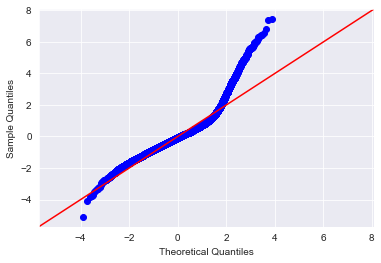

In [43]:
# Your code here - Check that the residuals are normally distributed
fig = sm.graphics.qqplot(linearModel3.resid, dist=stats.norm, line='45', fit=True)

In [48]:
linearModel4.params.sort_values()

const            -19966335.73450
long               -115282.75291
zipcode__98023      -31213.29537
floors              -27137.10909
zipcode__98092      -14852.60974
                       ...      
zipcode__98109      444440.02233
zipcode__98040      460965.50197
zipcode__98112      505984.42481
zipcode__98004      591923.53101
zipcode__98039      775418.21844
Length: 84, dtype: float64

In [51]:
#Create a df to show findings with out zipcode
findings_df = pd.DataFrame(linearModel4.params)
findings_df.reset_index(inplace=True)
findings_df.rename(columns={'index':'features',0:'coef'},inplace=True)

#DROPPING COLUMNS THAT CONTAIN ZIPCODES BECAUSE THEY ARE SO MANY AND THEY AREN'T TOO RELEVANT
#TO SUGGEST CHANGES TO A HOUSE
findings_df[~findings_df['features'].str.contains('zipcode')].sort_values(by='coef')

,features,coef
0,const,-19966335.73450
12,long,-115282.75291
5,floors,-27137.10909
1,bedrooms,-6583.56432
9,sqft_basement,-52.09717
4,sqft_lot,0.77797
10,yr_renovated,26.61188
13,sqft_living15,29.57730
3,sqft_living,137.28086
2,bathrooms,8936.23943


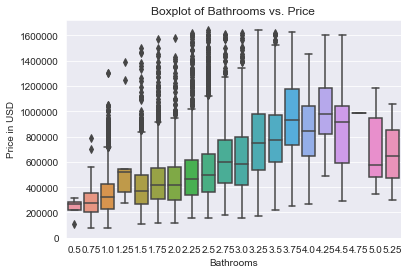

In [53]:
#Plot Boxplot

sns.boxplot(x = zipcode_df2['bathrooms'], y = zipcode_df2['price'])
plt.title(f"Boxplot of Bathrooms vs. Price")
plt.ylabel("Price in USD")
plt.xlabel(f"Bathrooms")
plt.show()

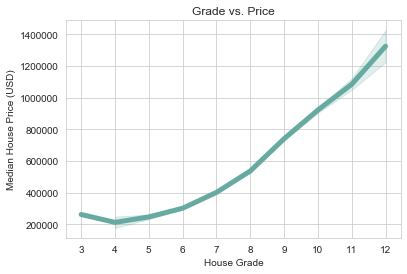

In [47]:
# Grade lineplot
with sns.axes_style("whitegrid"):
    sns.lineplot(x = zipcode_df2['grade'], y = zipcode_df2['price'], lw = 5, color = '#66aaa2', data = zipcode_df2)
plt.xticks(range(3,13))    
plt.ylabel('Median House Price (USD)')
plt.xlabel('House Grade')
plt.title('Grade vs. Price')
plt.show()

## Analysis 

We can see from the list above that the least important features that affect sale price are

* Water Front
* Bedrooms
* Bathrooms
* Square footage of lot

# Conclusions & Recommendations

## Question 1

* The number of bedrooms did not seem to affect the sale price. However for a given house depending on its square-footage, note that adding an additional bedroom does not necessarily result in a a sale price increase. 


## Question 2

* Grouping the zip codes into regions did not improve the model. However, by using the zip codes instead of the sub regions the model dramtically increased. Future analsis will invole seeing how the prices of house that are located to major sporting venues affect price.


## Question 3

* From the results of our model, you can see that the least significant features are "Bedrooms" , "Bathrooms", and "Sqft of Lot". Most significant features are "Sqft Living", "View", "grade", and "floors". As a homeowner, if you want to increase the value of your house you should

    * Increase the living square footage of the house.
    * Imporve the overall grade of the house.
    * Add a new floor.
